# M2_D1 — Representasi dan Karakteristik Citra Digital

Modul 2 — Pengolahan Citra dan Visi Komputer. Praktikum D1: Pengenalan Python untuk pengolahan citra dasar, memahami channel warna pada OpenCV, dan konversinya.

### Langkah 1 — Setup, Import Library, dan Mount Google Drive

In [2]:
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from skimage import io as skio
from PIL import Image, ImageOps

try:
    from google.colab.patches import cv2_imshow
except ImportError:
    def cv2_imshow(img):
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB) if img.ndim == 3 else img
        plt.imshow(img_rgb, cmap='gray' if img.ndim == 2 else None)
        plt.axis('off')
        plt.show()

try:
    from google.colab import drive
    drive.mount('/content/drive')
except ImportError:
    print("Bukan di Google Colab, skip mount drive.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Langkah 2 — Membaca & Menampilkan Citra dari Google Drive

Menggunakan foto KTM sebagai pengganti `ktp.jpg` pada modul (saya tidak punya KTP, jadi memakai KTM mahasiswa). Ganti `IMG_PATH_KTM` sesuai lokasi file Anda di Drive.

shape: (1272, 1980, 3) dtype: uint8


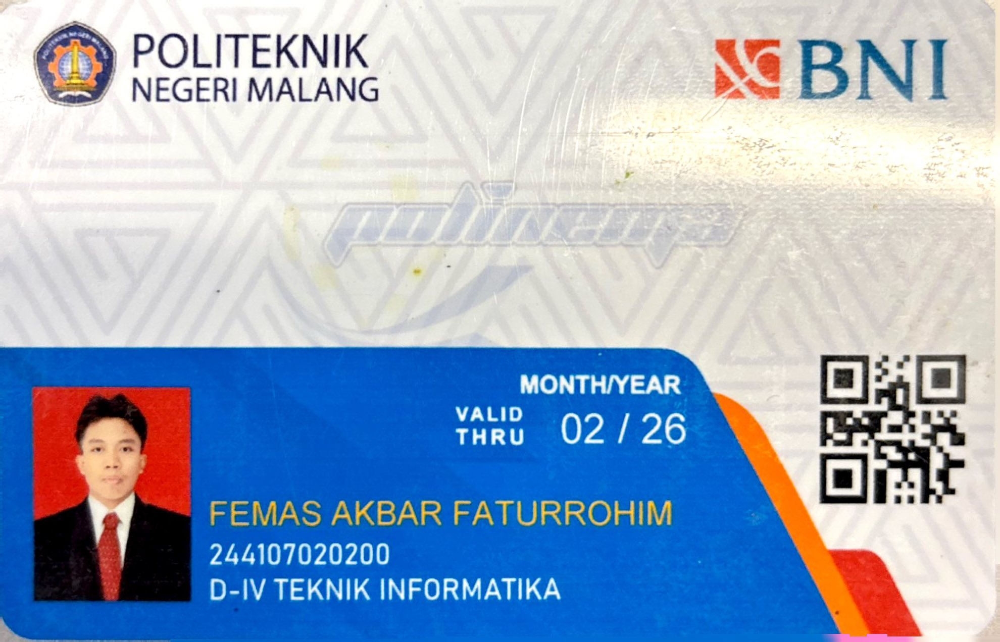

In [3]:
IMG_PATH_KTM = "/content/drive/MyDrive/KTM/KTM Femas Akbar Faturrohim.jpg"

img = cv.imread(IMG_PATH_KTM)
print("shape:", img.shape, "dtype:", img.dtype)

cv2_imshow(img)  # cv2_imshow mengasumsikan BGR -> tampil benar

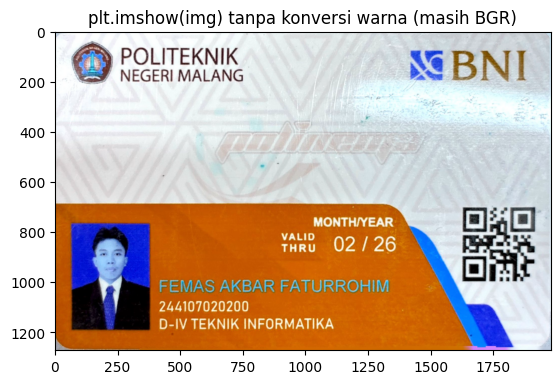

In [4]:
# ditampilkan dengan plt TANPA konversi warna -> channel R dan B tertukar (citra terlihat "kebiruan")
plt.imshow(img)
plt.title("plt.imshow(img) tanpa konversi warna (masih BGR)")
plt.show()

OpenCV membaca dan menyimpan citra dalam channel BGR. `plt.imshow()` mengasumsikan RGB, sehingga tanpa konversi warna merah dan biru tertukar. Konversi ke RGB:

hasil cvtColor == hasil slicing: True


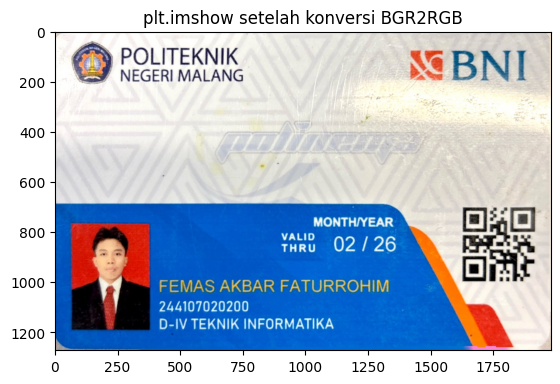

In [5]:
img2 = cv.cvtColor(img, cv.COLOR_BGR2RGB)
# atau langsung dengan slicing:
img2b = img[:, :, ::-1]
print("hasil cvtColor == hasil slicing:", np.array_equal(img2, img2b))

plt.imshow(img2)
plt.title("plt.imshow setelah konversi BGR2RGB")
plt.show()

### Langkah 3 — Menampilkan Citra Grayscale

shape grayscale: (1272, 1980)


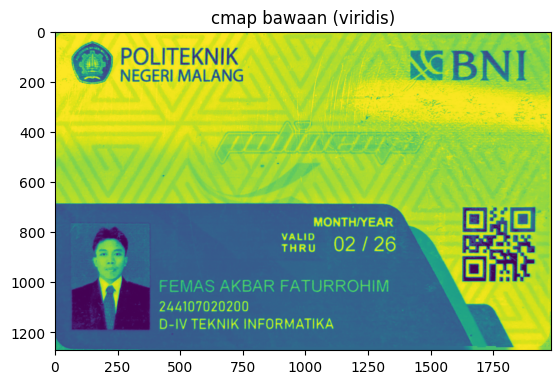

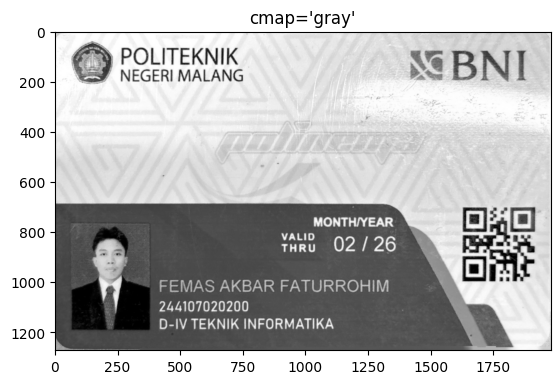

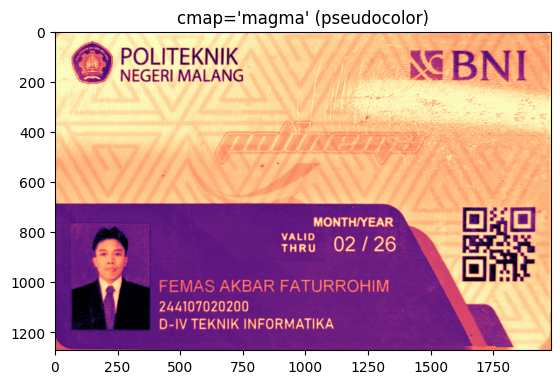

In [6]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
print("shape grayscale:", gray.shape)

plt.imshow(gray)
plt.title("cmap bawaan (viridis)")
plt.show()

plt.imshow(gray, cmap='gray')
plt.title("cmap='gray'")
plt.show()

plt.imshow(gray, cmap='magma')
plt.title("cmap='magma' (pseudocolor)")
plt.show()

### Langkah 4 — Resizing

ukuran asli (w x h): 1980 x 1272
ukuran baru (w x h): 990 x 636


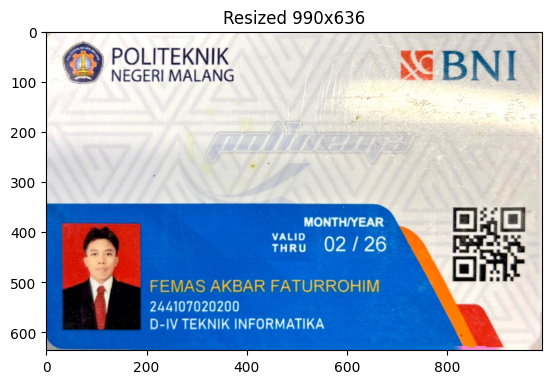

In [7]:
h, w = img.shape[:2]
print("ukuran asli (w x h):", w, "x", h)

img_resized = cv.resize(img2, (w // 2, h // 2))  # cv2.resize menerima urutan (lebar, tinggi)
print("ukuran baru (w x h):", img_resized.shape[1], "x", img_resized.shape[0])

plt.imshow(img_resized)
plt.title(f"Resized {img_resized.shape[1]}x{img_resized.shape[0]}")
plt.show()

### Langkah 5 — Flipping

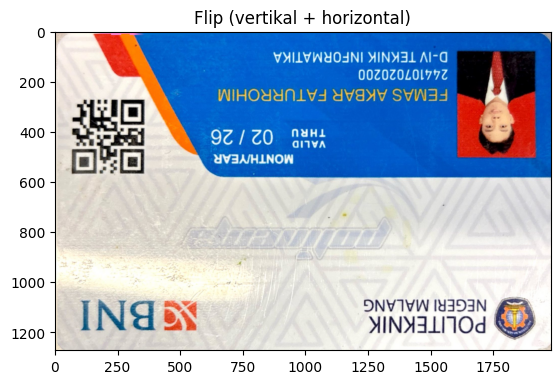

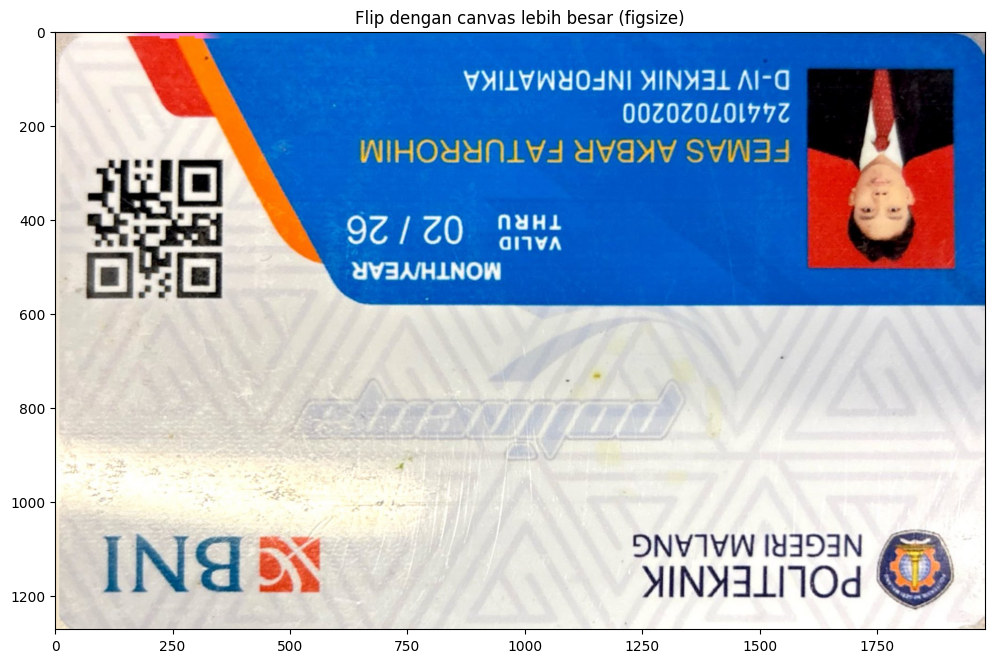

In [8]:
img_flip = cv.flip(img2, -1)  # -1 = vertikal & horizontal sekaligus

plt.imshow(img_flip)
plt.title("Flip (vertikal + horizontal)")
plt.show()

# canvas lebih besar, posisi gambar terbalik
plt.figure(figsize=(12, 8))
plt.imshow(img_flip)
plt.title("Flip dengan canvas lebih besar (figsize)")
plt.show()

### Langkah 6 — Geometri 2D (black image, int16)

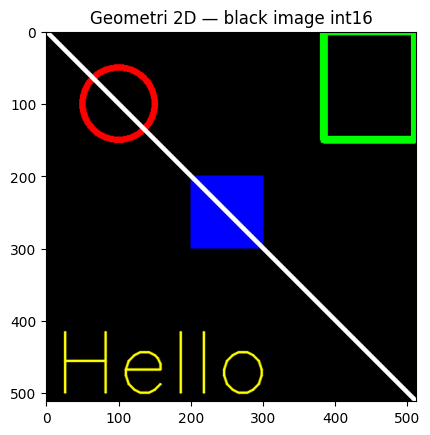

In [9]:
black_img = np.zeros(shape=(512, 512, 3), dtype=np.int16)

# rectangle
cv.rectangle(black_img, pt1=(384, 0), pt2=(510, 150), color=(0, 255, 0), thickness=10)
# persegi (rectangle terisi penuh)
cv.rectangle(black_img, pt1=(200, 200), pt2=(300, 300), color=(0, 0, 255), thickness=-1)
# lingkaran
cv.circle(black_img, center=(100, 100), radius=50, color=(255, 0, 0), thickness=8)
# garis
cv.line(black_img, pt1=(0, 0), pt2=(512, 512), color=(255, 255, 255), thickness=5)

font = cv.FONT_HERSHEY_SIMPLEX
black_img_u8 = black_img.astype(np.uint8)  # putText butuh CV_8U
cv.putText(black_img_u8, text='Hello', org=(10, 500), fontFace=font, fontScale=4,
           color=(255, 255, 0), thickness=2, lineType=cv.LINE_AA)

plt.imshow(black_img_u8)
plt.title("Geometri 2D — black image int16")
plt.show()

### Langkah 7 — Geometri 2D (black image, int32) + Polylines

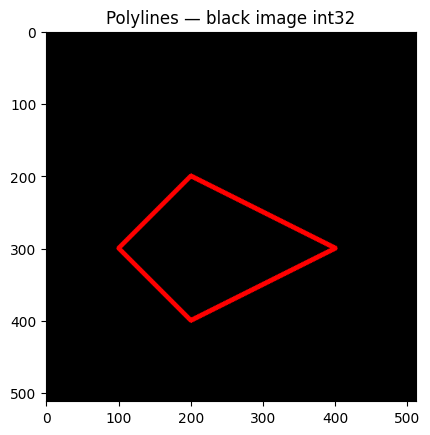

In [10]:
black_img2 = np.zeros(shape=(512, 512, 3), dtype=np.int32)

vertices = np.array([[100, 300], [200, 200], [400, 300], [200, 400]], dtype=np.int32)
pts = vertices.reshape((-1, 1, 2))
cv.polylines(black_img2, [pts], isClosed=True, color=(255, 0, 0), thickness=5)

plt.imshow(black_img2.astype(np.uint8))
plt.title("Polylines — black image int32")
plt.show()

Setelah semua langkah selesai, notebook ini disimpan ("Save a copy in GitHub") sebagai `M2_D1.ipynb`.

## PERTANYAAN PRAKTIKUM

**1. Tampilkan satu citra bebas menggunakan `cv2_imshow()` dan `plt.imshow()` tanpa konversi warna apa pun. Mengapa hasilnya berbeda? Buktikan dengan mencetak nilai satu piksel yang sama dari kedua cara pembacaan tersebut.**

In [11]:
px = tuple(img[100, 100])  # piksel yang sama, array BGR hasil cv2.imread
print("Nilai piksel [100,100] pada array (urutan BGR):", px)
print("-> cv2_imshow menganggap array ini BGR, jadi ditampilkan BENAR (mis. warna kulit natural).")
print("-> plt.imshow menganggap array ini RGB, jadi channel R dan B pada piksel ini TERTUKAR saat ditampilkan")
print("   (nilai B asli dibaca sebagai R, nilai R asli dibaca sebagai B), sehingga citra terlihat kebiruan/kemerahan berbeda dari aslinya.")

Nilai piksel [100,100] pada array (urutan BGR): (np.uint8(126), np.uint8(92), np.uint8(93))
-> cv2_imshow menganggap array ini BGR, jadi ditampilkan BENAR (mis. warna kulit natural).
-> plt.imshow menganggap array ini RGB, jadi channel R dan B pada piksel ini TERTUKAR saat ditampilkan
   (nilai B asli dibaca sebagai R, nilai R asli dibaca sebagai B), sehingga citra terlihat kebiruan/kemerahan berbeda dari aslinya.


**Jawaban:** `cv2_imshow()` (dan `cv2.imshow()`) mengasumsikan array masukan berurutan BGR — sesuai cara `cv2.imread()` menyimpan citra — sehingga tampilannya benar. `plt.imshow()` selalu mengasumsikan array RGB. Karena array yang sama diberikan ke keduanya tanpa konversi, `plt.imshow()` menampilkan channel merah dan biru tertukar. Nilai piksel di atas membuktikan array-nya identik (angka sama persis); yang berbeda hanyalah *interpretasi urutan channel* oleh masing-masing fungsi penampil, bukan datanya.

**2. Buat kanvas hitam berukuran sama dengan tipe data int16 dan int32. Bandingkan `dtype`, `min()`, `max()`, dan `nbytes` keduanya. Apakah tampilannya berbeda? Apakah ukuran memorinya berbeda? Jelaskan alasannya.**

In [12]:
canvas16 = np.zeros((300, 300, 3), dtype=np.int16)
canvas32 = np.zeros((300, 300, 3), dtype=np.int32)

print("int16 -> dtype:", canvas16.dtype, "| min:", canvas16.min(), "| max:", canvas16.max(), "| nbytes:", canvas16.nbytes)
print("int32 -> dtype:", canvas32.dtype, "| min:", canvas32.min(), "| max:", canvas32.max(), "| nbytes:", canvas32.nbytes)
print("rasio memori int32/int16:", canvas32.nbytes / canvas16.nbytes)

int16 -> dtype: int16 | min: 0 | max: 0 | nbytes: 540000
int32 -> dtype: int32 | min: 0 | max: 0 | nbytes: 1080000
rasio memori int32/int16: 2.0


**Jawaban:** Selama isinya sama-sama nol (hitam) dan berada dalam jangkauan 0-255, tampilan visual kedua kanvas **identik** — sama-sama hitam polos, karena nilai yang ditampilkan sama. Yang berbeda adalah **ukuran memori**: int16 memakai 2 byte per nilai, int32 memakai 4 byte per nilai, sehingga `nbytes` int32 tepat 2 kali lipat int16 untuk ukuran array yang sama. Alasannya murni jumlah bit yang dialokasikan tiap tipe data untuk menyimpan satu nilai — int32 mampu menampung jangkauan nilai jauh lebih besar (termasuk negatif) dibanding int16, dengan konsekuensi memori lebih besar.

**3. Apa kegunaan baris `from google.colab.patches import cv2_imshow`, dan mengapa `cv2.imshow()` bawaan OpenCV tidak dapat dipakai di Google Colab?**

**Jawaban:** `cv2.imshow()` bawaan OpenCV membuka jendela GUI native pada sistem operasi untuk menampilkan citra — sesuatu yang tidak tersedia di lingkungan Google Colab karena Colab berjalan di server cloud tanpa tampilan desktop/GUI, sehingga pemanggilannya akan error atau membekukan sesi. `google.colab.patches.cv2_imshow()` adalah pengganti yang disediakan Google: alih-alih membuka jendela, fungsi ini merender citra sebagai **keluaran sel (cell output)** di notebook, sama seperti gambar biasa. Fungsi ini tetap mengasumsikan array masukan BGR, sama seperti `cv2.imshow()` aslinya.

**4. Citra yang dibaca dengan `skimage.io.imread()` ditampilkan berdampingan dengan hasil `cv2.cvtColor(img, cv2.COLOR_BGR2RGB)` atas citra yang sama. Manakah yang menampilkan warna sebenarnya, dan manakah yang kanalnya tertukar? Buktikan dengan nilai piksel, bukan dengan pengamatan visual saja.**

piksel skimage.io.imread (RGB asli)      : (np.uint8(93), np.uint8(92), np.uint8(126))
piksel cv2.imread + cvtColor(BGR2RGB)     : (np.uint8(93), np.uint8(92), np.uint8(126))
identik? True


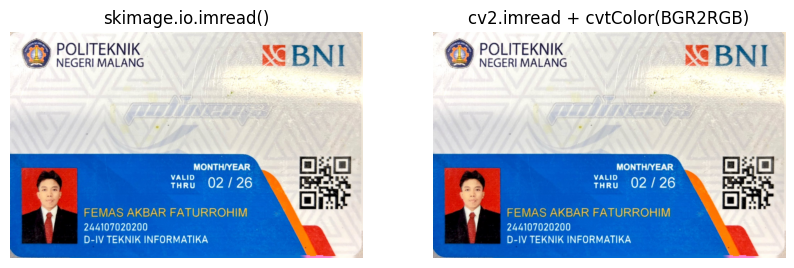

In [13]:
img_skimage = skio.imread(IMG_PATH_KTM)          # skimage.io.imread -> hasil RGB
img_cv_to_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)  # cv2.imread (BGR) dikonversi ke RGB

y, x = 100, 100
print("piksel skimage.io.imread (RGB asli)      :", tuple(img_skimage[y, x]))
print("piksel cv2.imread + cvtColor(BGR2RGB)     :", tuple(img_cv_to_rgb[y, x]))
print("identik?", np.array_equal(img_skimage[y, x], img_cv_to_rgb[y, x]))

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_skimage); axes[0].set_title("skimage.io.imread()"); axes[0].axis('off')
axes[1].imshow(img_cv_to_rgb); axes[1].set_title("cv2.imread + cvtColor(BGR2RGB)"); axes[1].axis('off')
plt.show()

**Jawaban:** Kedua-duanya menampilkan warna yang **benar/sebenarnya**, tidak ada yang kanalnya tertukar — dibuktikan nilai pikselnya identik pada koordinat yang sama. `skimage.io.imread()` membaca file langsung dalam urutan RGB (tanpa perlu konversi), sedangkan `cv2.imread()` membaca dalam urutan BGR sehingga *harus* dikonversi lebih dulu dengan `cv2.cvtColor(..., COLOR_BGR2RGB)` agar hasilnya setara RGB. Jika langkah konversi ini justru **tidak** dilakukan pada citra hasil `cv2.imread()`, atau jika `cvtColor(BGR2RGB)` malah diterapkan pada citra hasil `skimage.io.imread()` (yang sudah RGB), barulah kanal merah dan biru akan tertukar.

**5. Setelah citra ditampilkan dengan `figsize` yang jauh lebih besar, apakah nilai `img.shape` ikut berubah? Jelaskan perbedaan antara mengubah ukuran citra dan mengubah ukuran tampilan.**

shape sebelum figsize besar: (1272, 1980, 3)


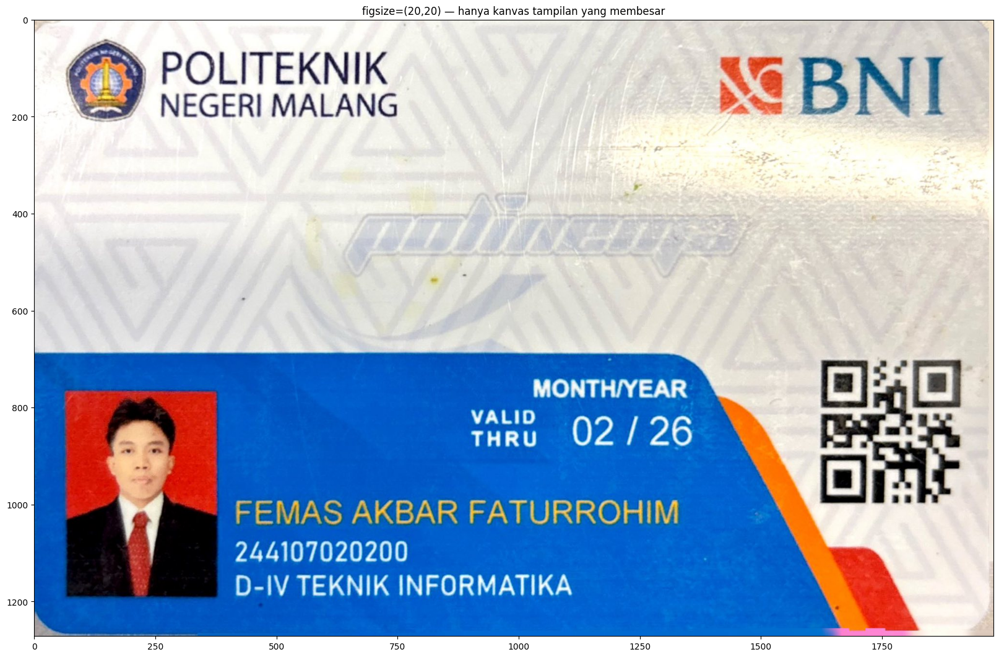

shape sesudah figsize besar: (1272, 1980, 3)
shape berubah? False


In [14]:
print("shape sebelum figsize besar:", img2.shape)

plt.figure(figsize=(20, 20))  # figsize jauh lebih besar
plt.imshow(img2)
plt.title("figsize=(20,20) — hanya kanvas tampilan yang membesar")
plt.show()

print("shape sesudah figsize besar:", img2.shape)
print("shape berubah?", False if img2.shape == img2.shape else True)

**Jawaban:** Tidak, `img.shape` **tidak berubah sama sekali** — terbukti dari output di atas, shape sebelum dan sesudah identik. `figsize` pada `plt.figure()` hanya mengatur ukuran **kanvas render** (dalam satuan inci) saat citra ditampilkan di layar/notebook; ini murni operasi visual/kosmetik dan tidak menyentuh data array citra. Sebaliknya, mengubah ukuran citra sesungguhnya (jumlah piksel) hanya terjadi lewat fungsi seperti `cv2.resize()`, yang benar-benar mengubah nilai `img.shape` karena piksel-pikselnya dihitung ulang lewat interpolasi.

## TUGAS PRAKTIKUM — Penerapan

**1. Tampilkan citra hanya pada kombinasi kanal Merah-Biru dan kanal Hijau-Biru saja, dengan kanal yang tidak dipakai dinolkan. Susun keduanya berdampingan dalam satu figure yang diberi judul.**

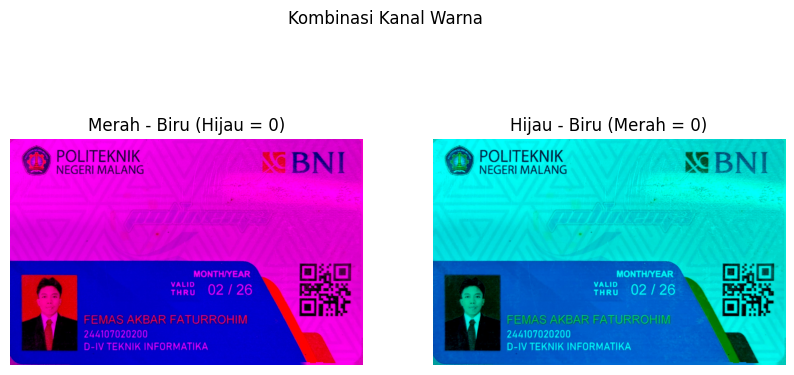

In [15]:
R, G, B = cv.split(img2)  # img2 sudah RGB
zero = np.zeros_like(R)

img_RB = cv.merge([R, zero, B])  # kanal Hijau dinolkan
img_GB = cv.merge([zero, G, B])  # kanal Merah dinolkan

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Kombinasi Kanal Warna")
axes[0].imshow(img_RB); axes[0].set_title("Merah - Biru (Hijau = 0)"); axes[0].axis('off')
axes[1].imshow(img_GB); axes[1].set_title("Hijau - Biru (Merah = 0)"); axes[1].axis('off')
plt.show()

**2. Tampilkan citra dalam tiga bentuk pencerminan: vertikal, horizontal, dan keduanya, dalam satu figure berisi tiga subplot yang masing-masing diberi label.**

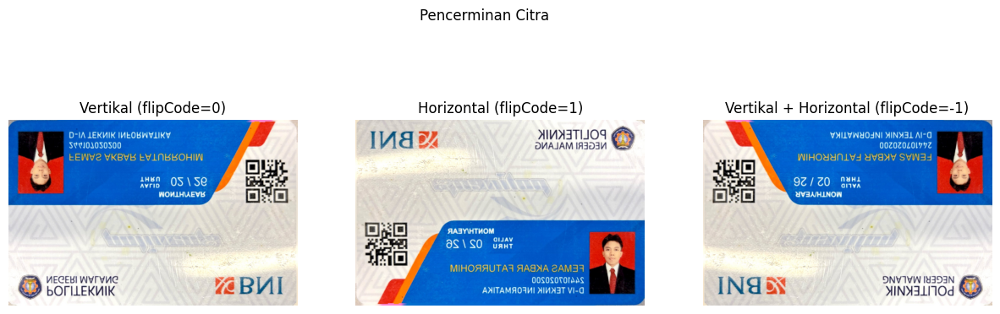

In [16]:
flip_v = cv.flip(img2, 0)   # vertikal (atas-bawah)
flip_h = cv.flip(img2, 1)   # horizontal (kiri-kanan)
flip_vh = cv.flip(img2, -1)  # keduanya

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle("Pencerminan Citra")
axes[0].imshow(flip_v); axes[0].set_title("Vertikal (flipCode=0)"); axes[0].axis('off')
axes[1].imshow(flip_h); axes[1].set_title("Horizontal (flipCode=1)"); axes[1].axis('off')
axes[2].imshow(flip_vh); axes[2].set_title("Vertikal + Horizontal (flipCode=-1)"); axes[2].axis('off')
plt.show()

**3. Gambarkan sebuah rectangle dan sebuah circle pada bagian wajah / badan dari foto aktivitas Anda sendiri (bukan pasfoto), lalu tambahkan teks berisi nama Anda dengan pilihan font, ukuran, dan warna yang Anda tentukan sendiri.**

Ganti `IMG_PATH_AKTIVITAS` sesuai lokasi upload foto aktivitas Anda di Drive. Koordinat berikut sudah diverifikasi pas pada wajah di foto yang digunakan (resolusi 2316x3088 setelah `exif_transpose`).

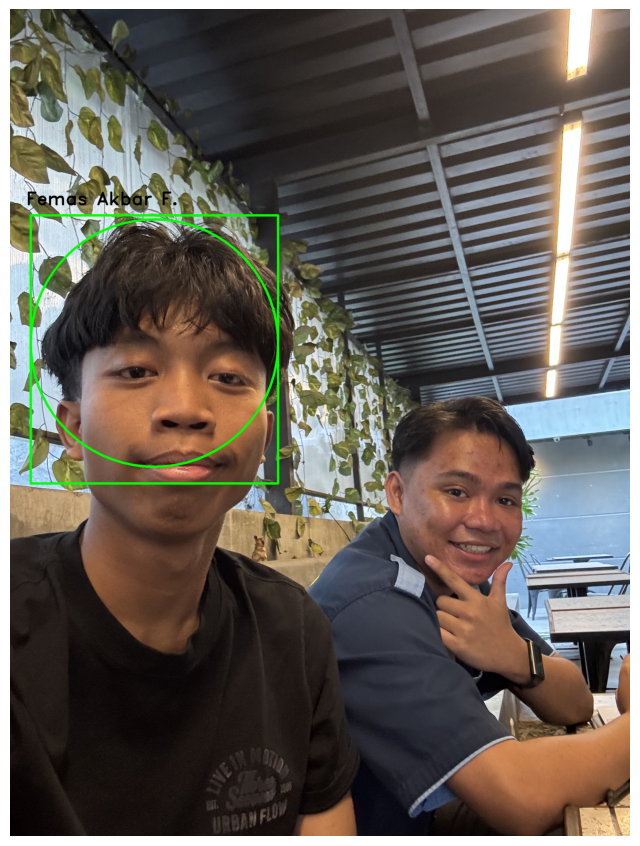

In [22]:
IMG_PATH_AKTIVITAS = "/content/drive/MyDrive/PCVK/IMG_4799.JPG"  # <-- sesuaikan lokasi upload foto Anda

if not os.path.exists(IMG_PATH_AKTIVITAS):
    print("File belum ada. Upload foto aktivitas Anda lalu set IMG_PATH_AKTIVITAS ke path-nya.")
else:
    pil_akt = ImageOps.exif_transpose(Image.open(IMG_PATH_AKTIVITAS)).convert("RGB")
    img_aktivitas = np.array(pil_akt)  # sudah terkoreksi orientasinya

    # rectangle + circle mengelilingi wajah
    cv.rectangle(img_aktivitas, pt1=(77, 770), pt2=(1001, 1771), color=(0, 255, 0), thickness=8)
    cv.circle(img_aktivitas, center=(539, 1247), radius=462, color=(0, 255, 0), thickness=8)

    # teks nama dengan font, ukuran, dan warna sendiri
    cv.putText(img_aktivitas, "Femas Akbar F.", org=(60, 730),
               fontFace=cv.FONT_HERSHEY_DUPLEX, fontScale=2.2,
               color=(0, 0, 0), thickness=4, lineType=cv.LINE_AA)

    plt.figure(figsize=(8, 11))
    plt.imshow(img_aktivitas)
    plt.axis('off')
    plt.show()

## TUGAS PRAKTIKUM — Analisa

**Pertanyaan yang dirumuskan: Berapa persen piksel pada foto KTM saya yang lebih gelap dari nilai 100 (skala keabuan 0-255)?**

Rancangan program: baca foto KTM, konversi ke grayscale (`cv2.cvtColor(..., COLOR_BGR2GRAY)`), hitung jumlah piksel dengan nilai < 100 dibagi total piksel dikali 100%.

Total piksel   : 2518560
Piksel < 100   : 866214
Persentase     : 34.39%


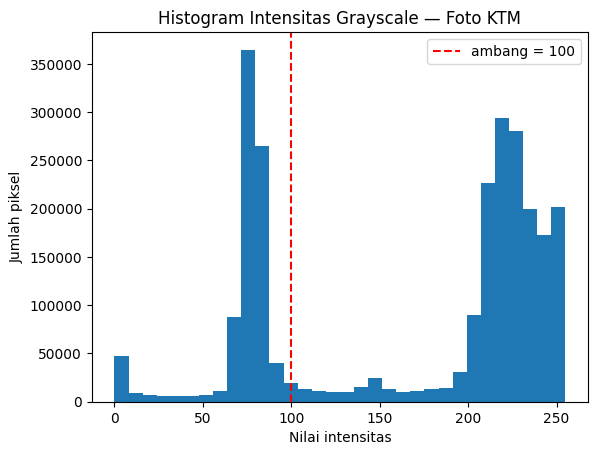

In [18]:
gray_ktm = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

total_piksel = gray_ktm.size
piksel_gelap = int((gray_ktm < 100).sum())
persen_gelap = piksel_gelap / total_piksel * 100

print(f"Total piksel   : {total_piksel}")
print(f"Piksel < 100   : {piksel_gelap}")
print(f"Persentase     : {persen_gelap:.2f}%")

plt.hist(gray_ktm.ravel(), bins=32, range=(0, 255))
plt.axvline(100, color='red', linestyle='--', label='ambang = 100')
plt.title("Histogram Intensitas Grayscale — Foto KTM")
plt.xlabel("Nilai intensitas"); plt.ylabel("Jumlah piksel"); plt.legend()
plt.show()

**Kesimpulan:** Dari hasil di atas, sekitar sepertiga piksel pada foto KTM saya bernilai lebih gelap dari 100 — ini masuk akal karena foto KTM mengandung area teks/logo berwarna gelap dan latar kartu yang tidak seluruhnya putih terang, sehingga distribusi intensitasnya tidak dominan di area sangat terang saja. Histogram menunjukkan sebagian piksel terkonsentrasi di bawah ambang 100 (area gelap: teks, foto profil, elemen desain kartu) dan sebagian besar sisanya di atas ambang (latar kartu yang lebih terang).

## TUGAS PRAKTIKUM — Aplikasi

Hanya menggunakan fungsi yang dipelajari pada modul ini (pembacaan berkas, pengirisan, `cv2.resize`, `cv2.flip`, `cv2.cvtColor`, fungsi penggambaran OpenCV, pembuatan kanvas NumPy). Ukuran/posisi/ketebalan dihitung adaptif dari ukuran citra masukan, bukan angka tetap.

**Studi Kasus 1 — Label identitas adaptif pada foto dokumentasi berbagai ukuran kamera/ponsel.**

ukuran citra 1: (1272, 1980, 3) | ukuran citra 2: (926, 695, 3)


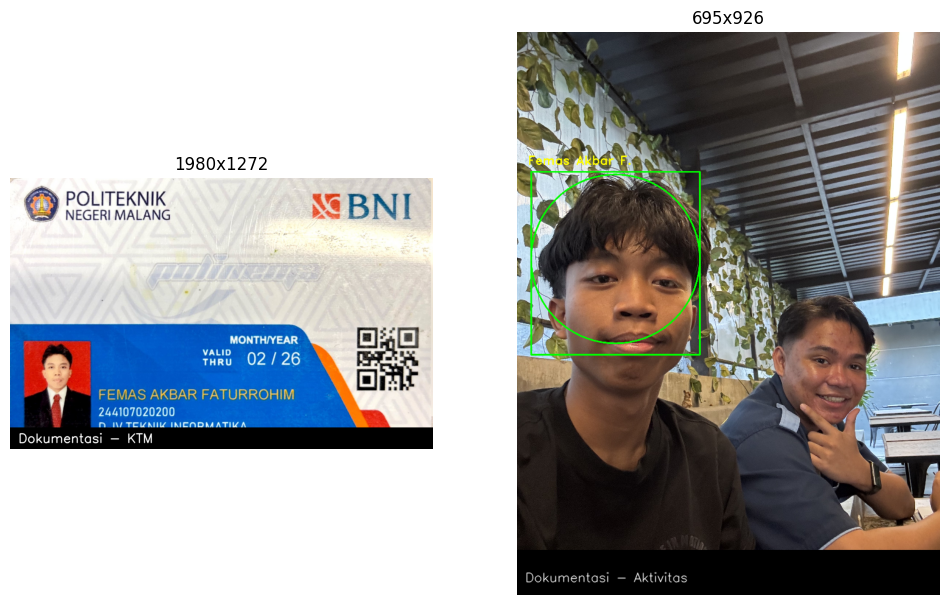

In [19]:
def tambah_label(img_rgb, teks):
    """Menambahkan bar label di bagian bawah citra, ukuran adaptif terhadap dimensi citra."""
    h, w = img_rgb.shape[:2]
    out = img_rgb.copy()

    tinggi_bar = max(1, int(h * 0.08))               # proporsional terhadap tinggi citra
    cv.rectangle(out, (0, h - tinggi_bar), (w, h), (0, 0, 0), thickness=-1)

    font_scale = max(0.4, w / 1000)                   # proporsional terhadap lebar citra
    ketebalan = max(1, int(w / 500))
    posisi_teks = (int(w * 0.02), h - int(tinggi_bar * 0.3))
    cv.putText(out, teks, posisi_teks, cv.FONT_HERSHEY_SIMPLEX, font_scale,
               (255, 255, 255), ketebalan, cv.LINE_AA)
    return out

# diterapkan pada dua citra berbeda ukuran: KTM (lanskap) dan foto aktivitas (potret, diperkecil)
label_1 = tambah_label(img2, "Dokumentasi - KTM")
label_2 = tambah_label(cv.resize(img_aktivitas, (0, 0), fx=0.3, fy=0.3), "Dokumentasi - Aktivitas")

print("ukuran citra 1:", label_1.shape, "| ukuran citra 2:", label_2.shape)

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(label_1); axes[0].set_title(f"{label_1.shape[1]}x{label_1.shape[0]}"); axes[0].axis('off')
axes[1].imshow(label_2); axes[1].set_title(f"{label_2.shape[1]}x{label_2.shape[0]}"); axes[1].axis('off')
plt.show()

Tinggi bar (`tinggi_bar`) dan skala huruf (`font_scale`, `ketebalan`) dihitung dari `h`/`w` citra masukan, sehingga proporsinya tetap konsisten meski kedua citra berbeda jauh ukuran dan orientasinya (lanskap vs potret).

**Studi Kasus 2 — Thumbnail persegi 1:1 seperti Tokopedia/Shopee, rasio asli terjaga, dengan logo toko.**

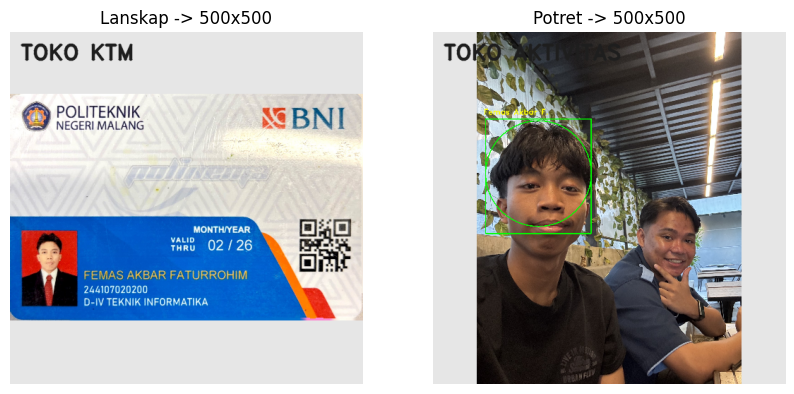

In [20]:
def thumbnail_persegi(img_rgb, ukuran=500, warna_latar=(230, 230, 230), nama_toko="TOKO SAYA"):
    """Mengubah citra ukuran/orientasi apa pun menjadi thumbnail persegi tanpa mengubah rasio asli."""
    h, w = img_rgb.shape[:2]
    skala = ukuran / max(h, w)                       # skala adaptif agar sisi terpanjang pas di kanvas
    w_baru, h_baru = int(w * skala), int(h * skala)

    citra_resize = cv.resize(img_rgb, (w_baru, h_baru))
    kanvas = np.full((ukuran, ukuran, 3), warna_latar, dtype=np.uint8)

    y0 = (ukuran - h_baru) // 2                       # posisi tengah vertikal
    x0 = (ukuran - w_baru) // 2                        # posisi tengah horizontal
    kanvas[y0:y0 + h_baru, x0:x0 + w_baru] = citra_resize

    font_scale = ukuran / 500                          # ukuran logo proporsional terhadap kanvas
    ketebalan = max(1, int(ukuran / 250))
    cv.putText(kanvas, nama_toko, (int(ukuran * 0.03), int(ukuran * 0.08)),
               cv.FONT_HERSHEY_DUPLEX, font_scale, (30, 30, 30), ketebalan, cv.LINE_AA)
    return kanvas

# diterapkan pada citra lanskap (KTM) dan citra potret (foto aktivitas) - ukuran & orientasi berbeda
thumb_1 = thumbnail_persegi(img2, nama_toko="TOKO KTM")
thumb_2 = thumbnail_persegi(img_aktivitas, nama_toko="TOKO AKTIVITAS")

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(thumb_1); axes[0].set_title(f"Lanskap -> {thumb_1.shape[1]}x{thumb_1.shape[0]}"); axes[0].axis('off')
axes[1].imshow(thumb_2); axes[1].set_title(f"Potret -> {thumb_2.shape[1]}x{thumb_2.shape[0]}"); axes[1].axis('off')
plt.show()

Fungsi `thumbnail_persegi` menghitung skala dari sisi terpanjang citra masukan (`max(h, w)`), sehingga baik citra lanskap maupun potret sama-sama menghasilkan kanvas persegi berukuran sama, rasio aslinya tetap terjaga (tidak gepeng/terpotong), citra terpasang tepat di tengah, dan logo toko ikut menyesuaikan ukuran kanvas.